In [1]:
import numpy as np
import pprint as pp
from matplotlib import pyplot as plt
import shutil
import os

In [2]:
instances = ["kroA100", "kroB100"]
methods = ["steepest", "greedy"]
neighbourhoods = ["inner", "between"]
beginning = ["random", "heuristic"]

In [3]:
data = {}

for i in instances:
    if i not in data:
        data[i] = {}
    for m in methods:
        if m not in data[i]:
            data[i][m] = {}
        for n in neighbourhoods:
            if n not in data[i][m]:
                data[i][m][n] = {}
            for b in beginning:
                if b not in data[i][m][n]:
                    data[i][m][n][b] = []

                file_path = "build/output/" + m + "/" + n + "/" + b + "/" + i + ".txt"


                with open(file_path, "r") as file:
                    for line in file:
                        line = line.strip().split()
                        run_nr = int(line[0][:-1])
                        length = int(line[1])
                        cycle = list(map(int, line[2:]))
                        data[i][m][n][b].append({"run_nr": run_nr, "length": length, "cycle": cycle})

In [4]:
pp.pprint(data)

{'kroA100': {'greedy': {'between': {'heuristic': [{'cycle': [31,
                                                             89,
                                                             42,
                                                             8,
                                                             67,
                                                             28,
                                                             58,
                                                             61,
                                                             51,
                                                             87,
                                                             9,
                                                             7,
                                                             20,
                                                             57,
                                                             25,
                            

In [5]:
def visualize_cycles(data, cycles, path):
     plt.figure(figsize=(8, 6))

     for node, (x, y) in data.items():
         plt.scatter(x, y, color='red', s=30)
         plt.text(x, y, str(node), fontsize=8, ha='left', va='bottom')

     colors = ['blue', 'green', 'orange', 'purple', 'cyan']
     for i, cycle in enumerate(cycles):
         cycle_x = [data[node][0] for node in cycle]
         cycle_y = [data[node][1] for node in cycle]
         cycle_x.append(cycle_x[0])
         cycle_y.append(cycle_y[0])
         plt.plot(cycle_x, cycle_y, linestyle='-', color=colors[i % len(colors)])

     plt.title('Visualization of Cycles')
     plt.xlabel('X-coordinate')
     plt.ylabel('Y-coordinate')
     plt.grid(True)
    #  plt.show()
     plt.savefig(path)

In [6]:
tsp_data = {
    "kroA100": {},
    "kroB100": {}
}

with open('kroA100.tsp', 'r') as file:
    for line in file:
        if line.startswith('EOF'):
            break
        parts = line.split()
        if parts[0].isdigit():
            node, x, y = map(int, parts)
            tsp_data["kroA100"][node] = (x, y)

with open('kroB100.tsp', 'r') as file:
    for line in file:
        if line.startswith('EOF'):
            break
        parts = line.split()
        if parts[0].isdigit():
            node, x, y = map(int, parts)
            tsp_data["kroB100"][node] = (x, y)

In [7]:
pp.pprint(tsp_data)

{'kroA100': {1: (1380, 939),
             2: (2848, 96),
             3: (3510, 1671),
             4: (457, 334),
             5: (3888, 666),
             6: (984, 965),
             7: (2721, 1482),
             8: (1286, 525),
             9: (2716, 1432),
             10: (738, 1325),
             11: (1251, 1832),
             12: (2728, 1698),
             13: (3815, 169),
             14: (3683, 1533),
             15: (1247, 1945),
             16: (123, 862),
             17: (1234, 1946),
             18: (252, 1240),
             19: (611, 673),
             20: (2576, 1676),
             21: (928, 1700),
             22: (53, 857),
             23: (1807, 1711),
             24: (274, 1420),
             25: (2574, 946),
             26: (178, 24),
             27: (2678, 1825),
             28: (1795, 962),
             29: (3384, 1498),
             30: (3520, 1079),
             31: (1256, 61),
             32: (1424, 1728),
             33: (3913, 192),
             34

In [8]:
print(data.keys())
print(data["kroA100"].keys())
print(data["kroA100"]["greedy"].keys())
print(data["kroA100"]["greedy"]["inner"].keys())
print(data["kroA100"]["greedy"]["inner"]["random"])
data["kroA100"]["greedy"]["inner"]["random"].sort(key=lambda x: x["length"])
print(data["kroA100"]["greedy"]["inner"]["random"][0])
print(data["kroA100"]["greedy"]["inner"]["random"][1])

dict_keys(['kroA100', 'kroB100'])
dict_keys(['steepest', 'greedy'])
dict_keys(['inner', 'between'])
dict_keys(['random', 'heuristic'])
[{'run_nr': 1, 'length': 34365, 'cycle': [27, 86, 77, 23, 98, 91, 32, 74, 59, 36, 18, 79, 88, 22, 26, 56, 42, 97, 75, 84, 47, 1, 93, 67, 61, 69, 64, 40, 44, 73, 50, 82, 13, 37, 39, 30, 85, 68, 81, 9, 34, 29, 46, 3, 14, 71, 43, 83, 55, 12]}, {'run_nr': 1, 'length': 34365, 'cycle': [65, 4, 80, 31, 89, 8, 92, 28, 58, 51, 25, 54, 2, 95, 76, 33, 5, 96, 78, 52, 48, 100, 41, 7, 87, 57, 20, 35, 62, 60, 45, 15, 17, 11, 63, 6, 49, 19, 90, 10, 72, 21, 99, 38, 24, 94, 16, 53, 70, 66]}, {'run_nr': 2, 'length': 34060, 'cycle': [65, 26, 56, 8, 42, 89, 54, 64, 44, 95, 13, 33, 37, 5, 96, 78, 52, 100, 3, 46, 29, 7, 12, 27, 86, 35, 62, 60, 77, 9, 87, 61, 67, 47, 91, 11, 15, 17, 21, 10, 90, 79, 38, 24, 18, 94, 88, 16, 70, 66]}, {'run_nr': 2, 'length': 34060, 'cycle': [80, 31, 40, 2, 50, 82, 76, 39, 85, 30, 48, 14, 71, 41, 43, 34, 83, 55, 20, 57, 68, 73, 69, 81, 25, 51, 58,

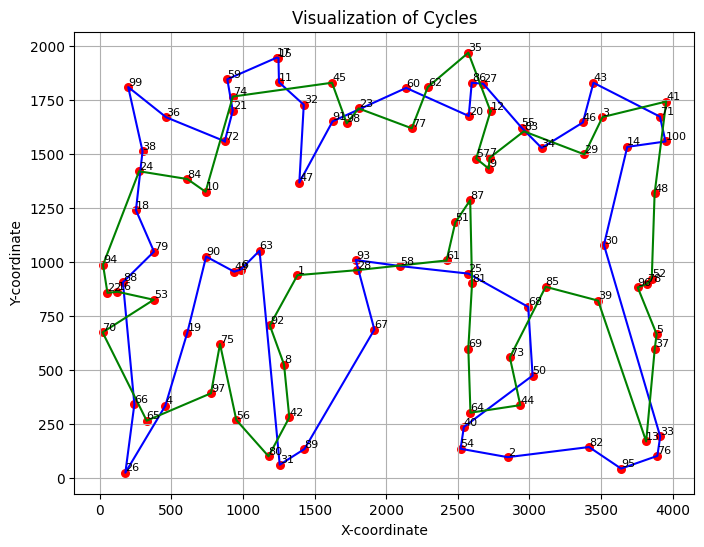

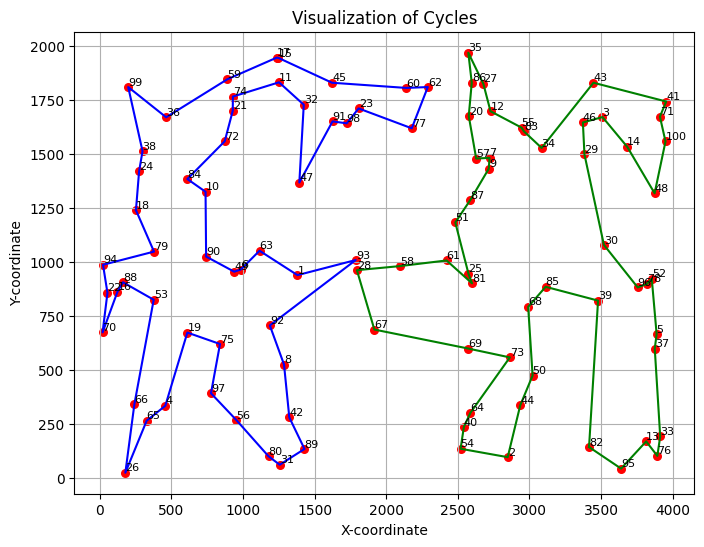

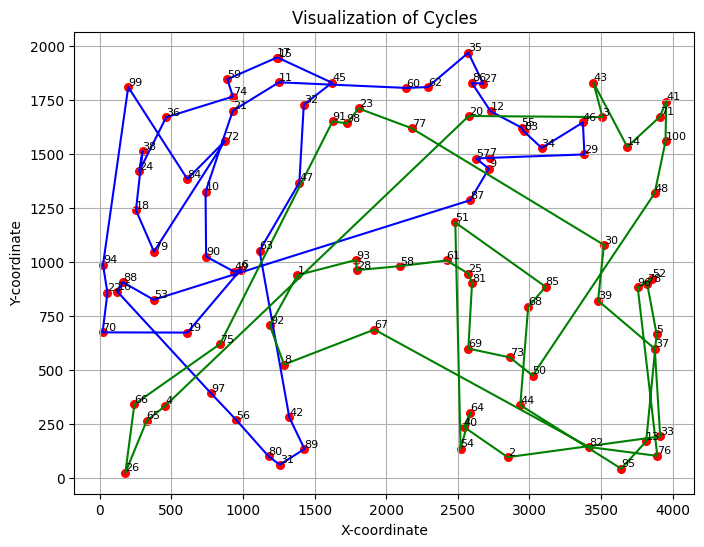

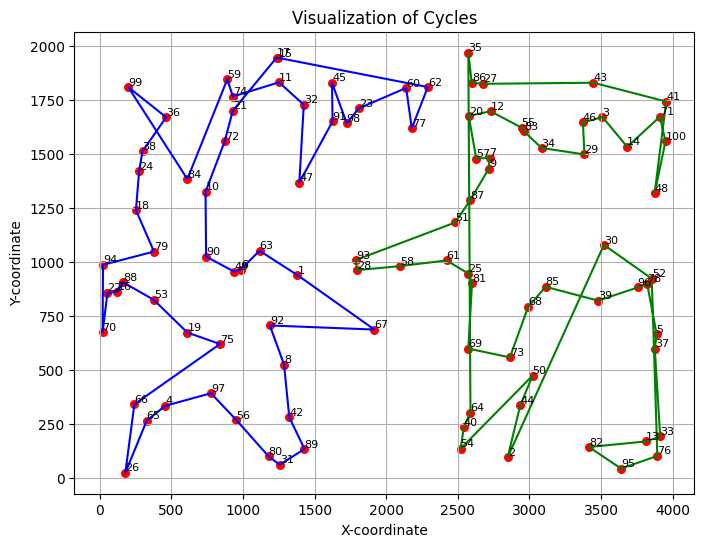

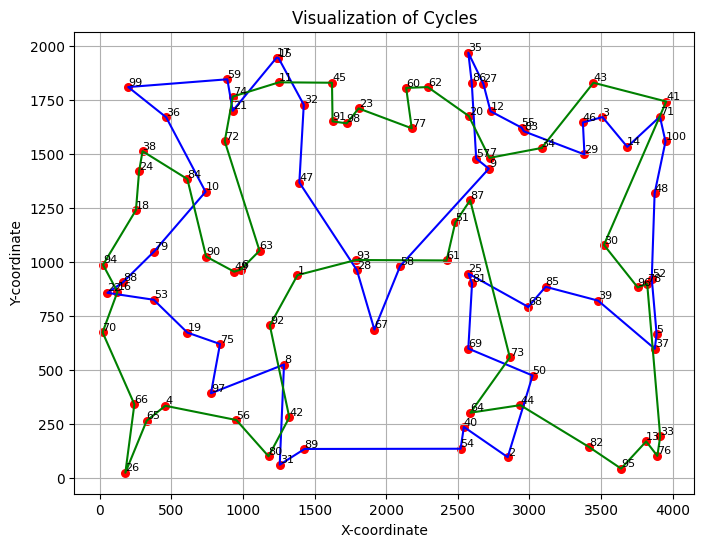

...

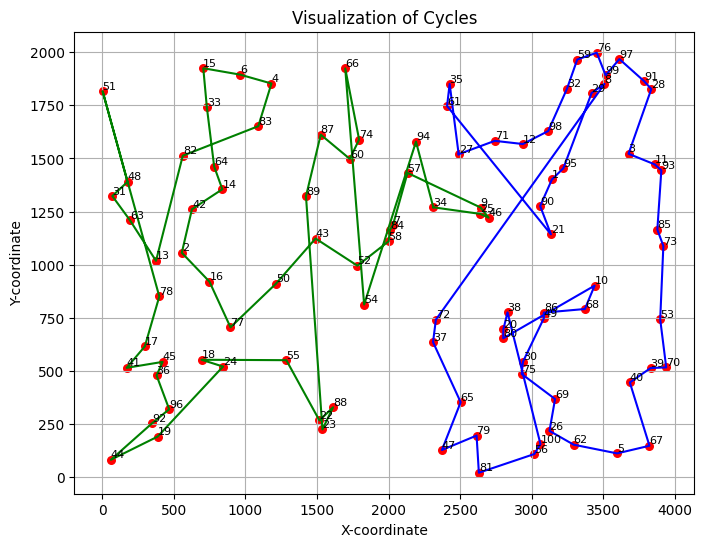

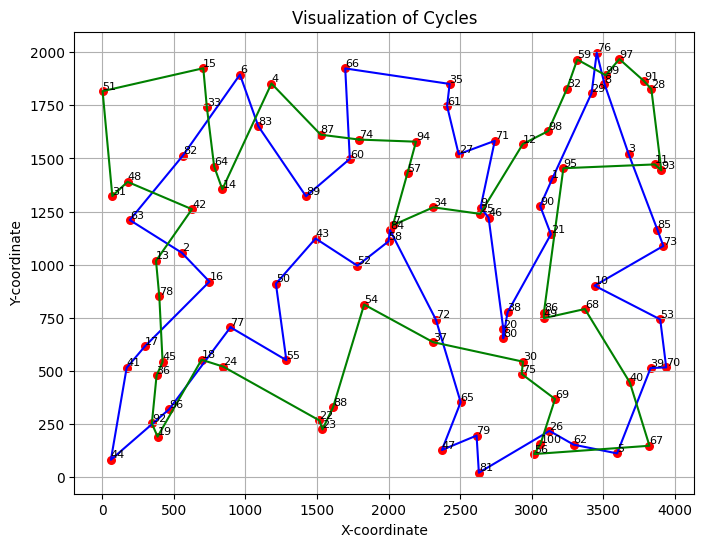

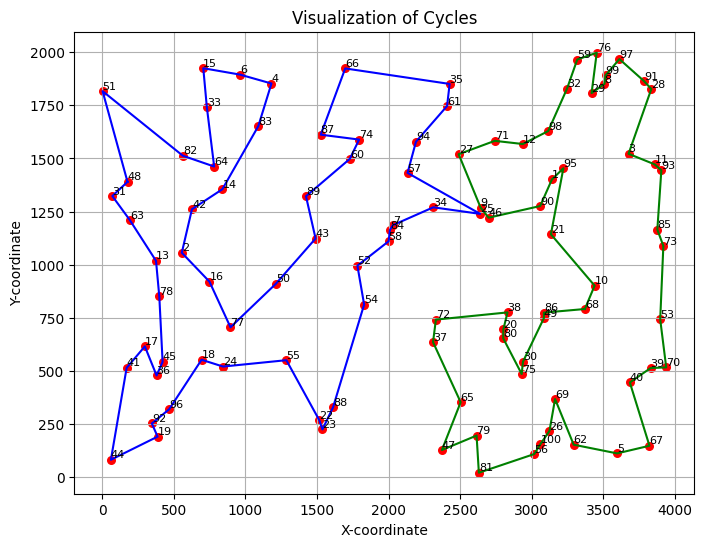

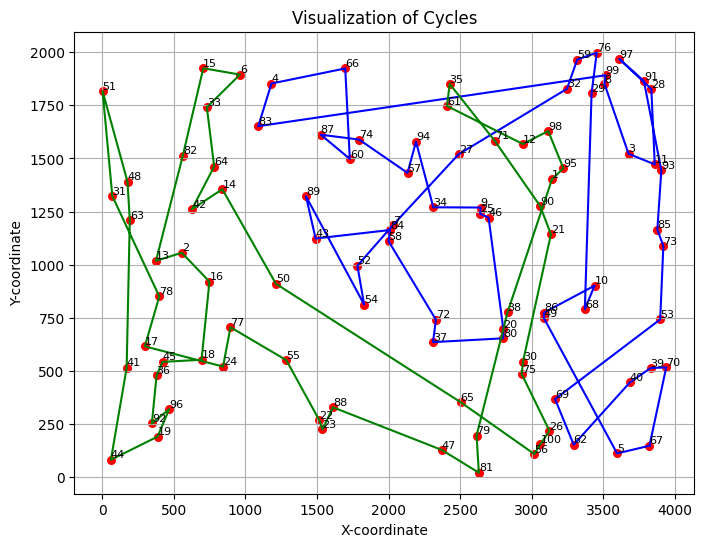

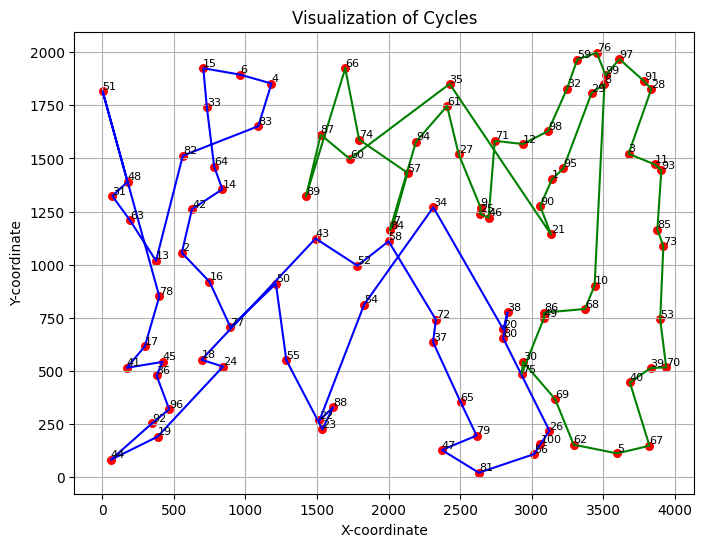

In [9]:
shutil.rmtree("plots", ignore_errors=True)
os.mkdir("plots")

for tsp_instance in data.keys():
    for method in data[tsp_instance].keys():
        for neighbour in data[tsp_instance][method].keys():
            for beginning in data[tsp_instance][method][neighbour].keys():
                path_to_plot = f"plots/{tsp_instance}_{method}_{neighbour}_{beginning}.png"
                data[tsp_instance][method][neighbour][beginning].sort(key=lambda x: x["length"])
                assert data[tsp_instance][method][neighbour][beginning][0]["run_nr"] == data[tsp_instance][method][neighbour][beginning][1]["run_nr"]

                first_cycle = data[tsp_instance][method][neighbour][beginning][0]["cycle"]
                second_cycle = data[tsp_instance][method][neighbour][beginning][1]["cycle"]

                cycles = [first_cycle, second_cycle]
                visualize_cycles(tsp_data[tsp_instance], cycles, path_to_plot)

In [11]:
tsp_instance = "kroA100"
for method in data[tsp_instance].keys():
    for neighbour in data[tsp_instance][method].keys():
        for beginning in data[tsp_instance][method][neighbour].keys():
            path_to_plotA = f"local-search/plots/{tsp_instance}_{method}_{neighbour}_{beginning}.png"
            path_to_plotB = f"local-search/plots/kroB100_{method}_{neighbour}_{beginning}.png"
            string = f"| {method} {neighbour} {beginning} | ![{method}_{neighbour}_{beginning}_A]({path_to_plotA}) | ![{method}_{neighbour}_{beginning}_B]({path_to_plotB}) |"
            print(string)

| steepest inner random | ![steepest_inner_random_A](local-search/plots/kroA100_steepest_inner_random.png) | ![steepest_inner_random_B](local-search/plots/kroB100_steepest_inner_random.png) |
| steepest inner heuristic | ![steepest_inner_heuristic_A](local-search/plots/kroA100_steepest_inner_heuristic.png) | ![steepest_inner_heuristic_B](local-search/plots/kroB100_steepest_inner_heuristic.png) |
| steepest between random | ![steepest_between_random_A](local-search/plots/kroA100_steepest_between_random.png) | ![steepest_between_random_B](local-search/plots/kroB100_steepest_between_random.png) |
| steepest between heuristic | ![steepest_between_heuristic_A](local-search/plots/kroA100_steepest_between_heuristic.png) | ![steepest_between_heuristic_B](local-search/plots/kroB100_steepest_between_heuristic.png) |
| greedy inner random | ![greedy_inner_random_A](local-search/plots/kroA100_greedy_inner_random.png) | ![greedy_inner_random_B](local-search/plots/kroB100_greedy_inner_random.png) |


In [13]:
for tsp_instance in data.keys():
    for method in data[tsp_instance].keys():
        for neighbour in data[tsp_instance][method].keys():
            for beginning in data[tsp_instance][method][neighbour].keys():
                path_to_plot = f"plots/{tsp_instance}_{method}_{neighbour}_{beginning}.png"
                lengths = np.array([l["length"] for l in data[tsp_instance][method][neighbour][beginning]])
                print(f"| {tsp_instance} | {method} {neighbour} {beginning} | {lengths.mean()} ({lengths.min()} - {lengths.max()}) |")
                

| kroA100 | steepest inner random | 33851.17 (31816 - 36246) |
| kroA100 | steepest inner heuristic | 26812.36 (23904 - 30188) |
| kroA100 | steepest between random | 52910.15 (41042 - 67550) |
| kroA100 | steepest between heuristic | 31630.19 (28769 - 35170) |
| kroA100 | greedy inner random | 34417.8 (30801 - 38255) |
| kroA100 | greedy inner heuristic | 27258.43 (23463 - 29234) |
| kroA100 | greedy between random | 43123.97 (36266 - 54241) |
| kroA100 | greedy between heuristic | 31974.89 (29382 - 34758) |
| kroB100 | steepest inner random | 34262.46 (31783 - 36894) |
| kroB100 | steepest inner heuristic | 25954.37 (22611 - 29852) |
| kroB100 | steepest between random | 51914.82 (41791 - 65046) |
| kroB100 | steepest between heuristic | 31597.95 (28709 - 33634) |
| kroB100 | greedy inner random | 34650.79 (31962 - 37520) |
| kroB100 | greedy inner heuristic | 26111.22 (23123 - 30336) |
| kroB100 | greedy between random | 43749.95 (35753 - 56861) |
| kroB100 | greedy between heuristi